In [2]:
import matplotlib.pyplot as plt
import astropy.table
import numpy as np
from pathlib import Path

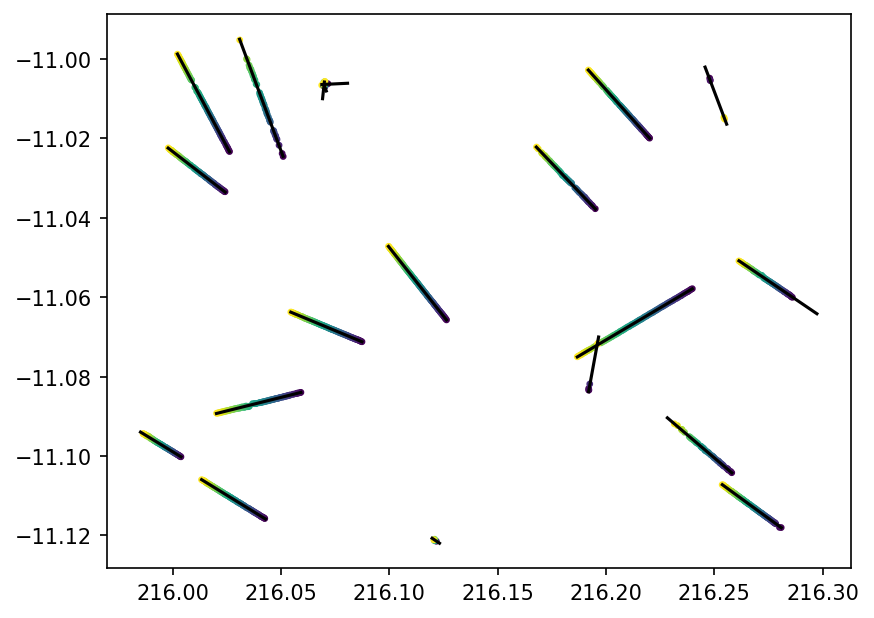

In [34]:
fig = plt.figure(dpi=150)
for p in Path("../test_simple/search_results").glob("*"):
    points = astropy.table.Table.read(p / "gathered.ecsv")
    tracklet = astropy.table.Table.read(p / "tracklet.ecsv")
    plt.scatter(points['ra'], points['dec'], c=points['time'], s=5)
    t = np.linspace(tracklet['t0'], tracklet['t1'], 100)
    plt.plot(tracklet['vra'] * t + tracklet['ra_0'], tracklet['vdec'] * t + tracklet['dec_0'], color='k')
plt.show()

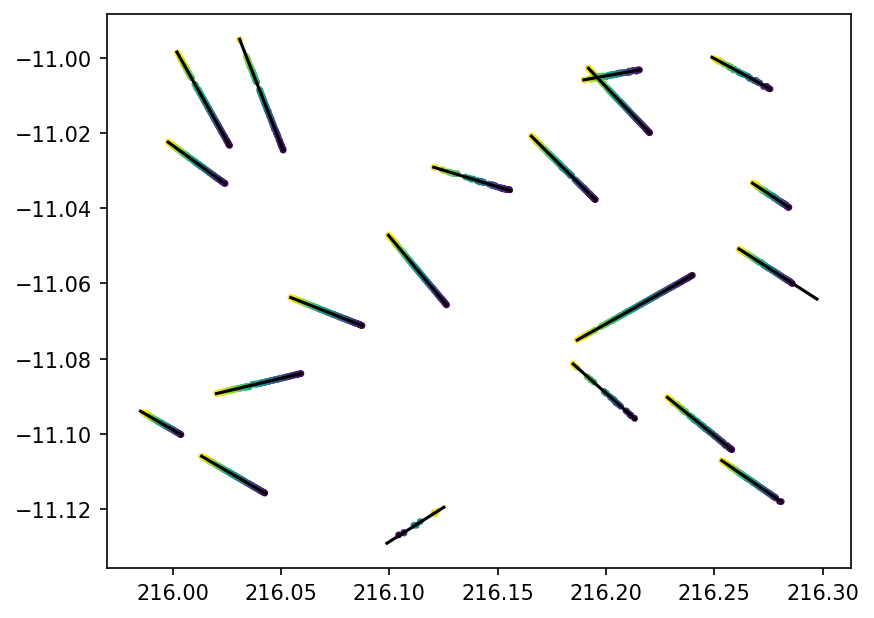

In [22]:
fig = plt.figure(dpi=150)
for p in Path("../test_simple/search_results_3.0").glob("*"):
    points = astropy.table.Table.read(p / "gathered.ecsv")
    tracklet = astropy.table.Table.read(p / "tracklet.ecsv")
    plt.scatter(points['ra'], points['dec'], c=points['time'], s=5)
    t = np.linspace(tracklet['t0'], tracklet['t1'], 100)
    plt.plot(tracklet['vra'] * t + tracklet['ra_0'], tracklet['vdec'] * t + tracklet['dec_0'], color='k')
plt.show()

In [33]:
tracklet

vra,vdec,ra_0,dec_0,t0,t1,sigma_vra,sigma_vdec,sigma_vravdec,sigma_vdecvra,sigma_t
deg / d,deg / d,deg,deg,d,d,deg / d,deg / d,deg2 / d2,deg2 / d2,d
float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
0.156303059614605,0.056956879613047226,-8939.699116937982,-3347.504509961027,58577.21560552204,58577.38366577728,0.00024146753431855602,0.0002802920968676428,-5.361545843365182e-08,-5.361545843365521e-08,0.001945963512612222


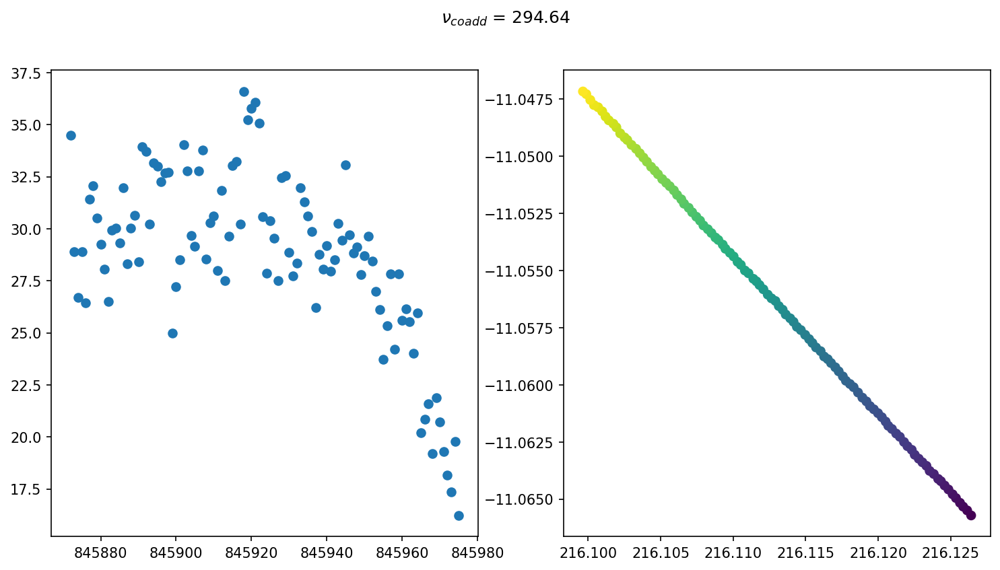

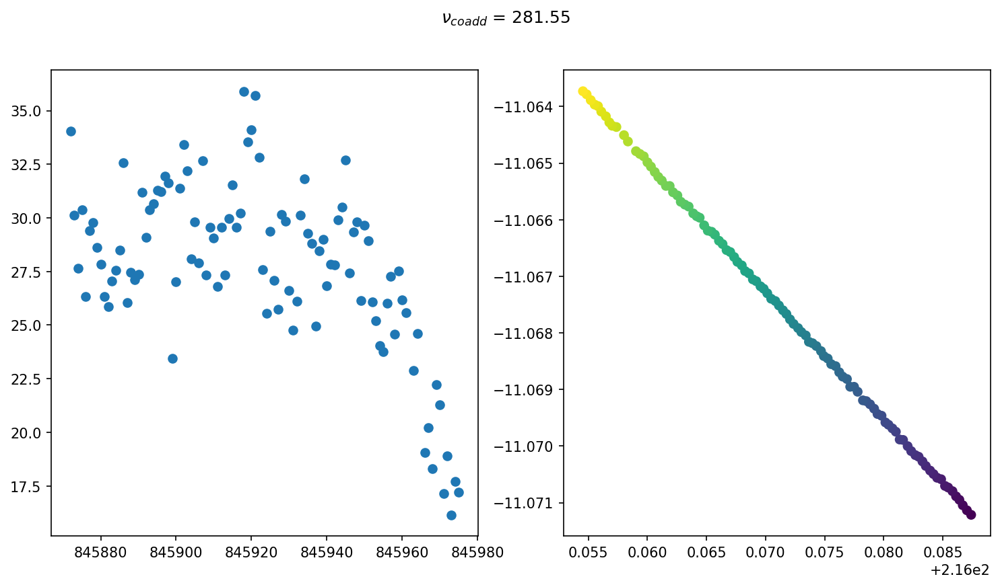

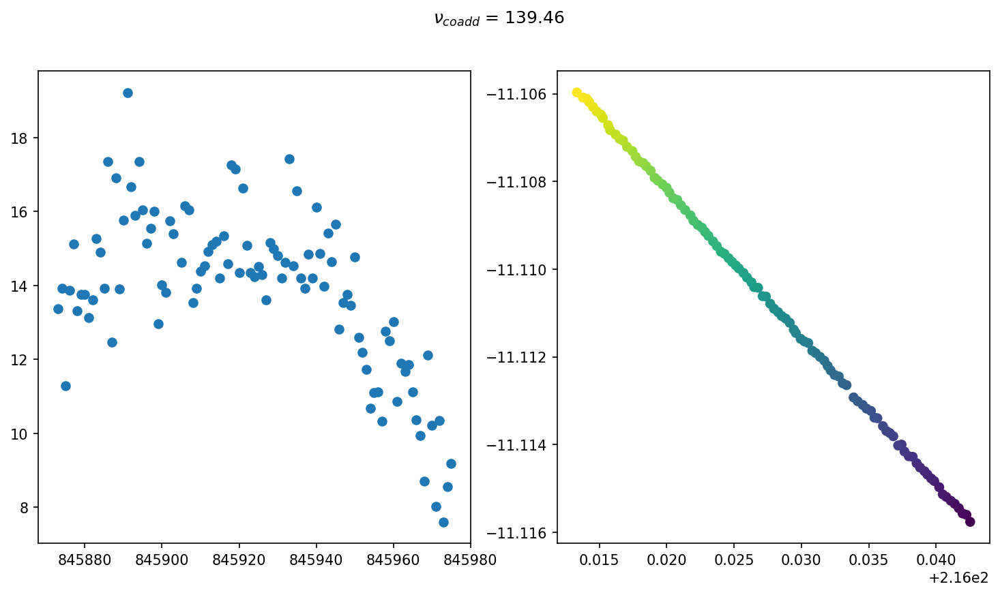

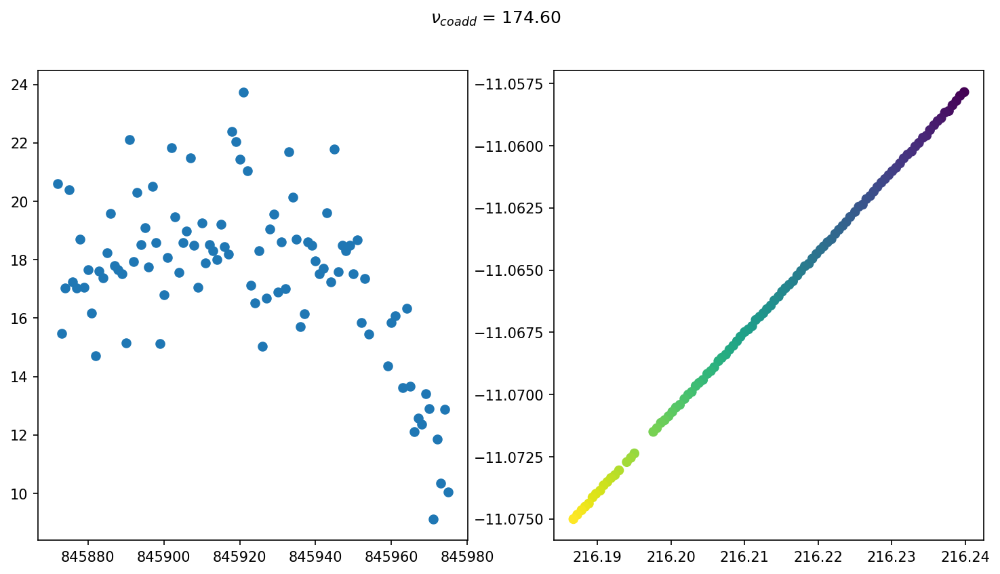

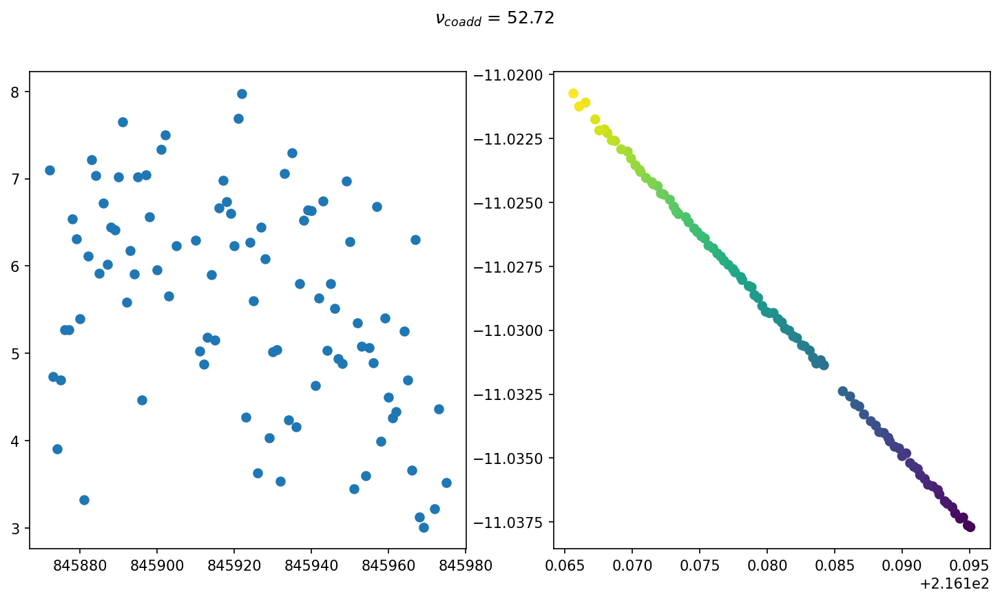

...

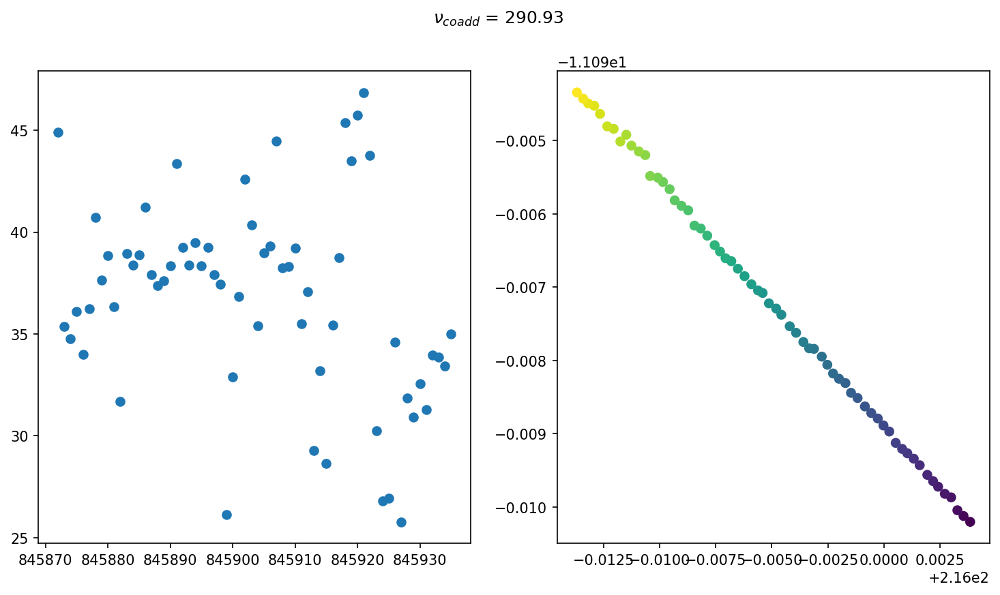

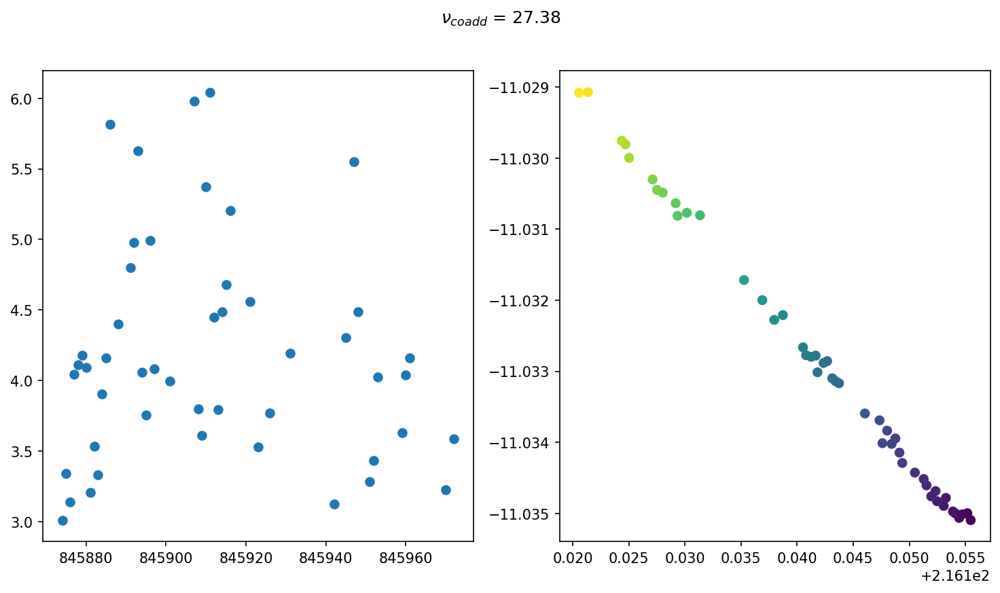

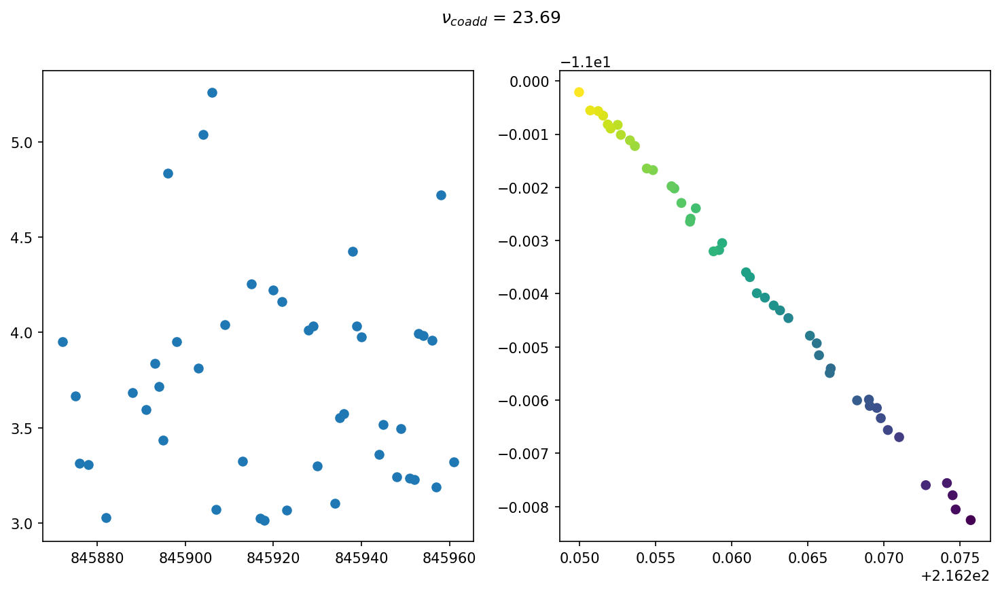

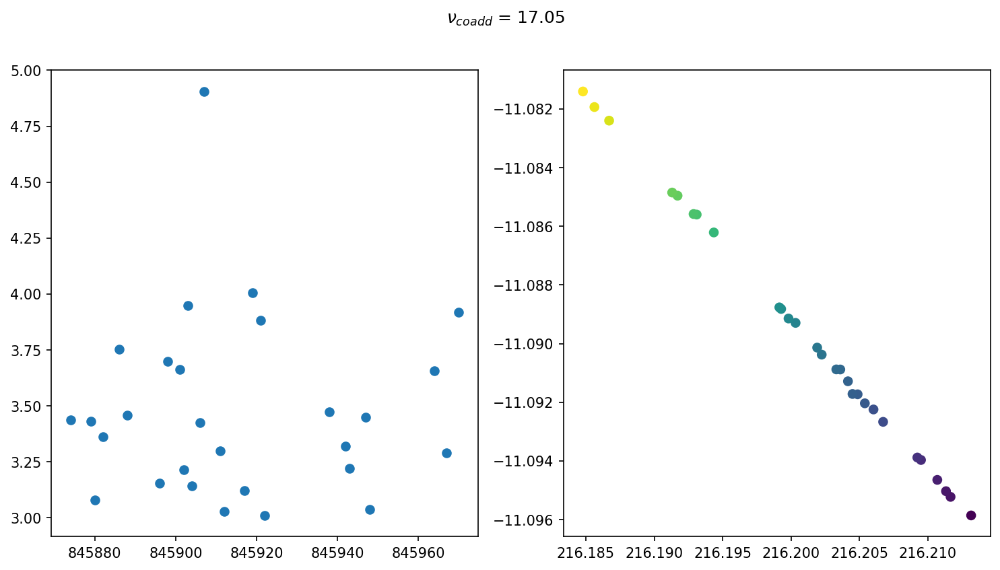

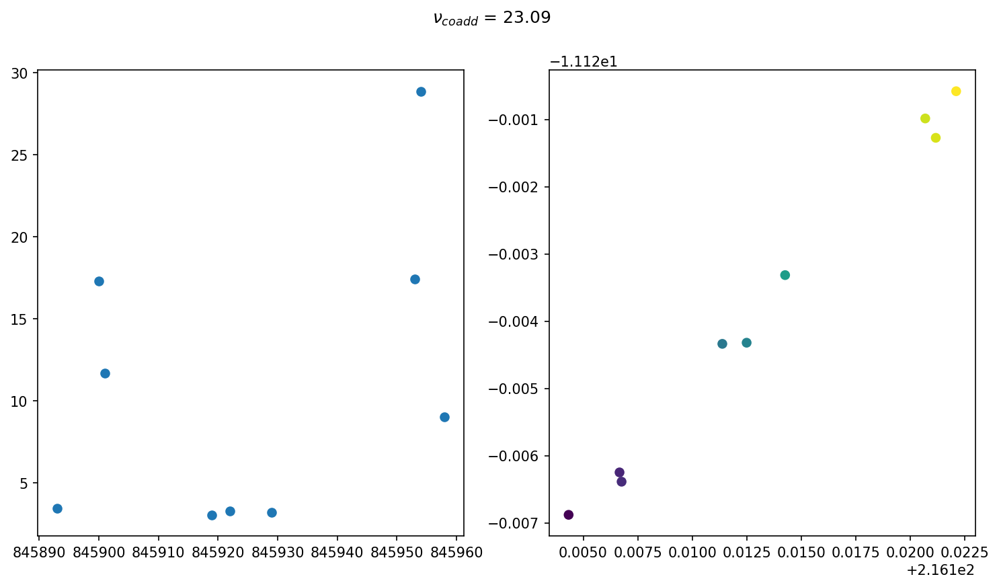

In [32]:
for p in Path("../test_simple/search_results_3.0").glob("*"):
    points = astropy.table.Table.read(p / "gathered.ecsv")
    tracklet = astropy.table.Table.read(p / "tracklet.ecsv")
    
    fig = plt.figure(dpi=150, figsize=(12, 6))
    axs = fig.subplots(nrows=1, ncols=2)
    
    plt.sca(axs[0])
    plt.scatter(points['exposures'], points['significance'])
    plt.sca(axs[1])
    plt.scatter(points['ra'], points['dec'], c=points['time'])
    
    fig.suptitle(r"$\nu_{coadd}$ = " + f"{points['psi'].sum() / (points['phi'].sum())**0.5:0.2f}")
    
    plt.show()

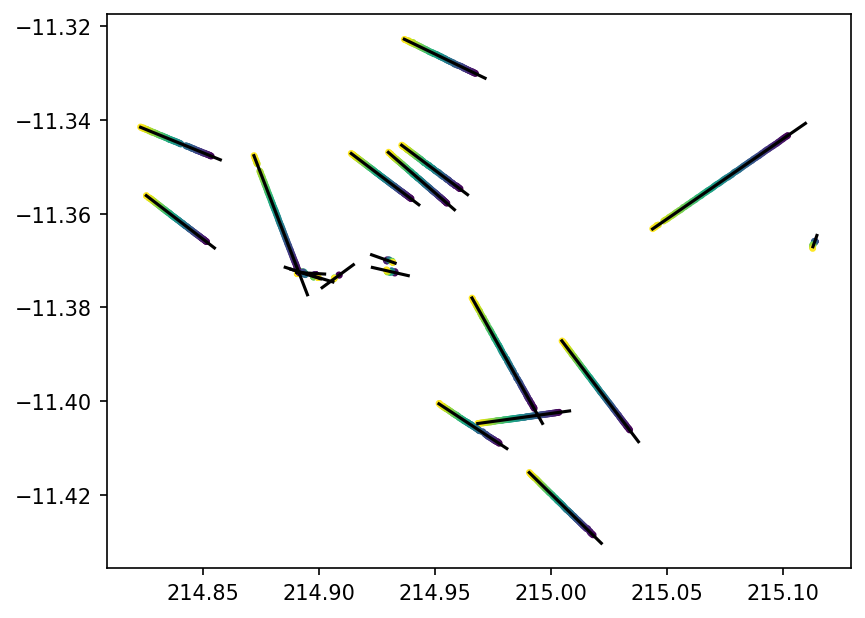

In [35]:
fig = plt.figure(dpi=150)
for p in Path("../test_simple/allSky/detector_3/results").glob("*"):
    points = astropy.table.Table.read(p / "gathered.ecsv")
    tracklet = astropy.table.Table.read(p / "tracklet.ecsv")
    plt.scatter(points['ra'], points['dec'], c=points['time'], s=5)
    t = np.linspace(tracklet['t0'], tracklet['t1'], 100)
    plt.plot(tracklet['vra'] * t + tracklet['ra_0'], tracklet['vdec'] * t + tracklet['dec_0'], color='k')
plt.show()

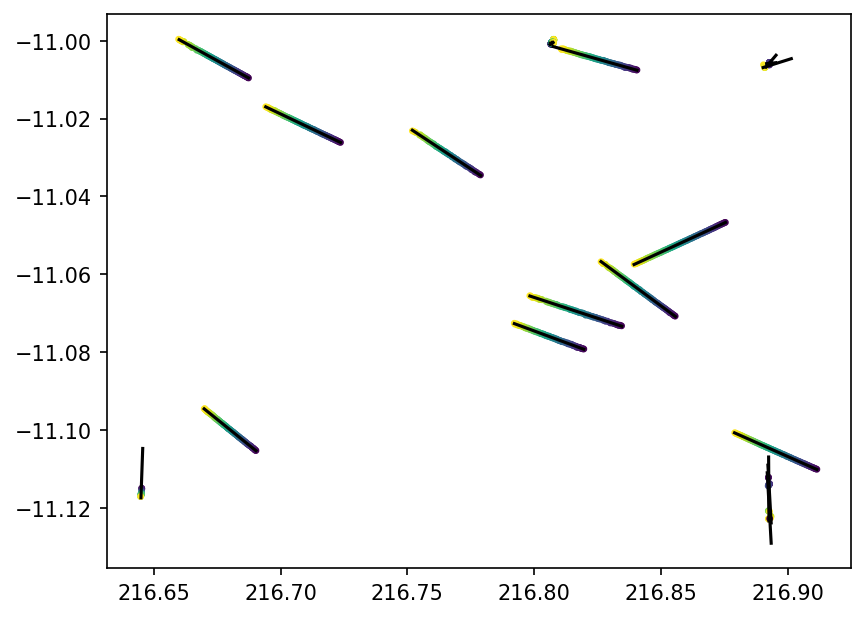

In [37]:
fig = plt.figure(dpi=150)
for p in Path("../test_simple/allSky/detector_3/results_20190403_A0c").glob("*"):
    points = astropy.table.Table.read(p / "gathered.ecsv")
    tracklet = astropy.table.Table.read(p / "tracklet.ecsv")
    plt.scatter(points['ra'], points['dec'], c=points['time'], s=5)
    t = np.linspace(tracklet['t0'], tracklet['t1'], 100)
    plt.plot(tracklet['vra'] * t + tracklet['ra_0'], tracklet['vdec'] * t + tracklet['dec_0'], color='k')
plt.show()

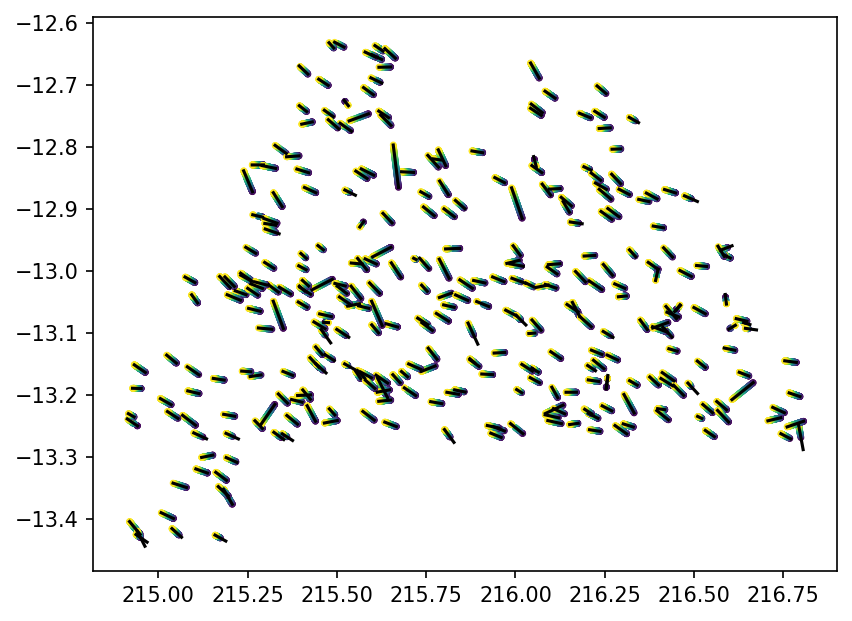

In [157]:
fig = plt.figure(dpi=150)
# for p in Path("/epyc/data4/salad_simpler_search/20190402/A0b/10").rglob("**/results_0.003_0.04_0_359_10_50/results/*"):
chi2 = []
for p in Path("/epyc/data4/salad_simpler_search/20190402/A0b").rglob("**/results_0.1_0.5_0_359_10_50/results/*"):
#     print(p)
    try:
        points = astropy.table.Table.read(p / "gathered.ecsv")
        tracklet = astropy.table.Table.read(p / "tracklet.ecsv")
    except:
        continue

    ra = points['ra']
    dec = points['dec']
    time = points['time']
    sigma = points['sigma_x']
    _ra = tracklet['vra'] * time + tracklet['ra_0']
    _dec = tracklet['vdec'] * time + tracklet['dec_0']
    N = ra.shape[0]
    x = np.vstack([ra, dec]).T # N x 2
    u = np.vstack([_ra, _dec]).T # N x 2
    inv_cov = np.array([np.eye(2) * 1/s for s in sigma]) # N x 2 x 2

    
    sse = 0
    for i in range(N):
        sse += (x[i] - u[i]).T @ inv_cov[i] @ (x[i] - u[i])

    if N < 10:
        continue
        
    if not (0.1 <= (tracklet['vra']**2 + tracklet['vdec']**2)**0.5 <= 0.5):
        continue
        
    plt.scatter(points['ra'], points['dec'], c=points['time'], s=5)
    t = np.linspace(tracklet['t0'], tracklet['t1'], 100)
    plt.plot(tracklet['vra'] * t + tracklet['ra_0'], tracklet['vdec'] * t + tracklet['dec_0'], color='k')
    
plt.show()

# plt.hist(np.log10(chi2))
# plt.show()

In [147]:
ra = points['ra']
dec = points['dec']
time = points['time']
sigma = points['sigma_x']
_ra = tracklet['vra'] * time + tracklet['ra_0']
_dec = tracklet['vdec'] * time + tracklet['dec_0']
N = ra.shape[0]
x = np.vstack([ra, dec]).T # N x 2
u = np.vstack([_ra, _dec]).T # N x 2
inv_cov = np.array([np.eye(2) * 1/s for s in sigma]) # N x 2 x 2

sse = 0
for i in range(N):
    sse += (x[i] - u[i]).T @ inv_cov[i] @ (x[i] - u[i])
print(x.shape, u.shape, inv_cov.shape, sse)
# (x - u).T @ inv_cov

(87, 2) (87, 2) (87, 2, 2) 0.0010866329736480568


In [144]:
(x - u).T @ inv_cov

ValueError: matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 2 is different from 87)

In [145]:
inv_cov.shape

(87, 2, 2)

In [146]:
(x - u).T.shape

(2, 87)

In [15]:
pgs = [
    (20190402, "A0b"),
    (20190403, "A0c"),
    (20190503, "A0c"),
    (20190503, "A1a"),
    (20190504, "A0c"),
    (20190504, "A1c"),
    (20190506, "A0b"),
    (20190506, "A1b"),
    (20190601, "A1b"),
    (20190602, "A1a"),
    (20190603, "A1c"),
    (20190706, "B0a"),
    (20190707, "B0a"),
    (20190708, "B0a"),
    (20190827, "B0c"),
    (20190827, "B1c"),
    (20190828, "B0a"),
    (20190828, "B1a"),
    (20190829, "B0b"),
    (20190829, "B1b"),
    (20190926, "B1a"),
    (20190927, "B1b"),
    (20190928, "B1c")
]

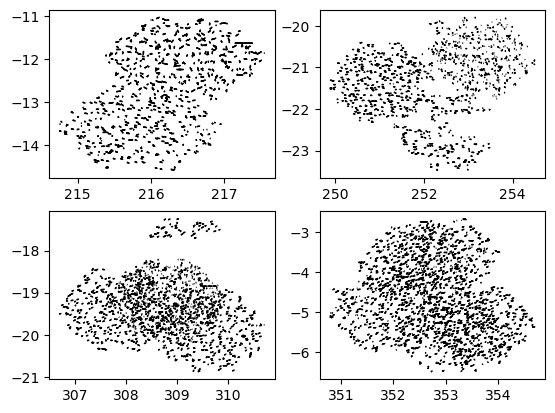

In [21]:
fig, axs = plt.subplots(2, 2)
axs = axs.flatten()
for night, target in pgs:
    p = Path(f"/epyc/data4/salad_simpler_search/merged/tracklet_pointing_group_{night}_{target}_detector_*_snr_5.0_results_0.1_0.5_0_359_10_50.fits")
    if target[:2] == "A0":
        plt.sca(axs[0])
    if target[:2] == "A1":
        plt.sca(axs[1])
    if target[:2] == "B0":
        plt.sca(axs[2])
    if target[:2] == "B1":
        plt.sca(axs[3])

    if p.exists():
        t = astropy.table.Table.read(p)
        t = t[t['result_number'] <= 15]
        for r in t:
            ra0 = r['vra'] * r['t0'] + r['ra_0']
            ra1 = r['vra'] * r['t1'] + r['ra_0']
            dec0 = r['vdec'] * r['t0'] + r['dec_0']
            dec1 = r['vdec'] * r['t1'] + r['dec_0']
            plt.arrow(ra0, dec0, ra1 - ra0, dec1 - dec0)
#     break
        
#         t = t[t['result_number'] <= 15]
#         plt.scatter(t['ra'], t['dec'], c=t['time'], s=1)
        
plt.show()

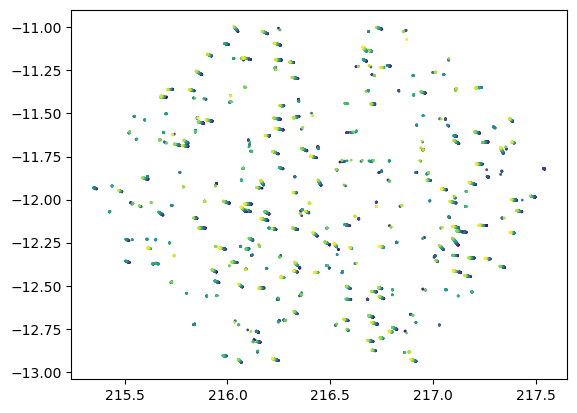

In [25]:
t = astropy.table.Table.read(
    Path("/epyc/data4/salad_simpler_search/merged/gathered_pointing_group_20190403_A0c_detector_*_snr_5.0_results_0.1_0.5_0_359_10_50.fits")
)

t = t[t['result_number'] <= 15]

plt.scatter(t['ra'], t['dec'], c=t['time'], s=1)
plt.show()

In [48]:
p = astropy.table.Table.read(
    Path("/epyc/data4/salad_simpler_search/merged/gathered_pointing_group_20190403_A0c_detector_*_snr_5.0_results_0.1_0.5_0_359_10_50.fits")
)
p.group_by(['detector', 'result_number']).groups[0]

FileNotFoundError: [Errno 2] No such file or directory: '/epyc/data4/salad_simpler_search/merged/tracklet_pointing_group_20190403_A0c_detector_*_snr_5.0_results_0.1_0.5_0_359_10_50.fits'

In [63]:
t[t['detector'] == 1 t['result_number'] == 10]

vra,vdec,ra_0,dec_0,t0,t1,sigma_vra,sigma_vdec,sigma_vravdec,sigma_vdecvra,sigma_t,detector,night,field,snr,results_type,result_number
deg / d,deg / d,deg,deg,d,d,deg / d,deg / d,deg2 / d2,deg2 / d2,d,,,,,,
float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64,bytes3,float64,bytes19,int64
-0.1376787929895801,0.15077031144428457,8280.930539972303,-8843.775433074676,58577.21560552204,58577.393984940834,3.303600882699149e-05,3.8150056836561295e-05,-3.0233282349666603e-10,-3.023328235034423e-10,0.002433876314478571,34,20190403,A0c,5.0,0.1_0.5_0_359_10_50,10
0.024343199229609896,0.028110883022283505,-1208.9754481445657,-1658.6671451688162,58577.21560552204,58577.388831184246,0.0004143071422928112,0.00047008995632276466,6.826467663396434e-09,6.826467663396434e-09,5.0220790184412176e-05,37,20190403,A0c,5.0,0.1_0.5_0_359_10_50,10
0.0744148181333387,0.062346914679225596,-4142.664189999661,-3664.669637471605,58577.21560552204,58577.367808049545,0.0005923546528003108,0.0005028712945693757,-8.398714241266821e-08,-8.398714241266821e-08,0.0005347260059236333,53,20190403,A0c,5.0,0.1_0.5_0_359_10_50,10
0.0034548500006897987,0.08694094722111602,14.699459464131849,-5103.952808251277,58577.21560552204,58577.36091073789,0.000526730622570733,0.00040122835646129305,-2.3826295280925917e-08,-2.3826295280925944e-08,0.0006492998944207382,7,20190403,A0c,5.0,0.1_0.5_0_359_10_50,10
-0.0007270408110337968,-0.03037198955735265,258.4252788637874,1766.3828524256303,58577.21560552204,58577.390541809145,0.00032182118130316597,0.00037521834308279224,-6.5276158044285965e-09,-6.527615804428596e-09,4.559127028142673e-05,56,20190403,A0c,5.0,0.1_0.5_0_359_10_50,10
-0.1811869343510155,0.09540797977827457,10829.385405839748,-5601.216590479837,58577.21560552204,58577.33132773498,4.7800845507898493e-05,3.765977917916823e-05,-2.820676245877821e-10,-2.820676245877821e-10,0.0009252712661590534,51,20190403,A0c,5.0,0.1_0.5_0_359_10_50,10
-0.15986521195091227,0.051342146043090474,9580.890643406337,-3019.236901393702,58577.21560552204,58577.39226360712,2.7719795085645193e-05,2.107896602257092e-05,-8.337666490313106e-11,-8.337666490313106e-11,0.0015150688557847534,21,20190403,A0c,5.0,0.1_0.5_0_359_10_50,10
-0.16378670337292123,0.08334861365220238,9810.99298946785,-4895.082931204232,58577.21560552204,58577.393984940834,4.8895008665599805e-05,4.868788284765751e-05,-1.714141601894697e-10,-1.7141416019285784e-10,0.001403267972531226,59,20190403,A0c,5.0,0.1_0.5_0_359_10_50,10


In [57]:
r

ra,dec,sigma_x,flux,flux_sigma,significance,time,exposures,detectors,peakValue,psi,phi,i_x,i_y,detector,night,field,snr,results_type,result_number
deg,deg,arcsec,,,,d,,,ct,,,pix,pix,,,,,,
float64,float64,float64,float64,float64,float64,float64,int64,int64,float32,float64,float64,int32,int32,int64,int64,bytes3,float64,bytes19,int64
216.00383640873247,-11.100201077788872,0.0005153176603506447,7398.9612820058255,164.2822802130549,45.15538787841797,58577.21560552204,845872,1,73.22964,0.2741506692312162,3.705258870565345e-05,1493,229,1,20190403,A0c,5.0,0.1_0.5_0_359_10_50,10
216.00354118120163,-11.100121457359242,0.0012126479881143554,6741.452137828243,192.33530720951953,35.35230255126953,58577.21731682867,845873,1,46.83216,0.18223652463424908,2.7032235920161338e-05,1485,226,1,20190403,A0c,5.0,0.1_0.5_0_359_10_50,10
216.0032673406358,-11.100042798285529,0.0014327461665584102,7070.291738220178,203.66123470409548,34.775760650634766,58577.21909338422,845874,1,42.775604,0.17045925638221548,2.4109225289920727e-05,1484,228,1,20190403,A0c,5.0,0.1_0.5_0_359_10_50,10
216.00298897406878,-11.099867588788461,0.001167383918114353,6896.451276147773,191.85317250343076,36.11923599243164,58577.22080451343,845875,1,47.72501,0.18736466977208577,2.7168272821720583e-05,1485,231,1,20190403,A0c,5.0,0.1_0.5_0_359_10_50,10
216.00270690561453,-11.099818374457254,0.0015216033583745987,6918.9774309067025,204.10919990796523,33.9980583190918,58577.22251877701,845876,1,41.57343,0.1660797771229044,2.40035147941132e-05,1483,231,1,20190403,A0c,5.0,0.1_0.5_0_359_10_50,10
216.00240813474545,-11.099721358990946,0.0011100968328987253,6822.218332785984,188.57659755910674,36.22034454345703,58577.22423474211,845877,1,49.110992,0.19184479596279141,2.8120588730036715e-05,1482,226,1,20190403,A0c,5.0,0.1_0.5_0_359_10_50,10
216.00218388555163,-11.09964597065588,0.0008185231015869242,7493.110889428397,184.12985980668515,40.71244812011719,58577.22595066577,845878,1,57.679237,0.2210109109941642,2.9495214238184557e-05,1478,220,1,20190403,A0c,5.0,0.1_0.5_0_359_10_50,10
216.00192718588906,-11.099560232888614,0.001110599754624953,7317.966975847407,195.67784957336227,37.62661361694336,58577.22767416015,845879,1,49.1613,0.1911204288853079,2.611660171685545e-05,1477,222,1,20190403,A0c,5.0,0.1_0.5_0_359_10_50,10


In [90]:
v = (t['vra']**2 + t['vdec']**2)**0.5
m = (0.1 < v) & (v < 0.5)
_t = t[m]

In [91]:
rows = []
for d, r, _ in list(filter(lambda x : x[2], (map(lambda x : (x[0]['detector'], x[0]['result_number'], len(x) > 15), p.group_by(['detector', 'result_number']).groups)))):
    rows.append(t[(t['detector'] == d) & (t['result_number'] == r)])


In [92]:
astropy.table.vstack(rows)

vra,vdec,ra_0,dec_0,t0,t1,sigma_vra,sigma_vdec,sigma_vravdec,sigma_vdecvra,sigma_t,detector,night,field,snr,results_type,result_number
deg / d,deg / d,deg,deg,d,d,deg / d,deg / d,deg2 / d2,deg2 / d2,d,,,,,,
float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64,bytes3,float64,bytes19,int64
-0.16114968285036196,0.05367480270500238,9655.703547583586,-3155.220682221176,58577.21560552204,58577.33132773498,2.5011289593585265e-05,2.551255470052157e-05,-1.8703791404246702e-10,-1.8703791404331405e-10,0.0008798969239475857,1,20190403,A0c,5.0,0.1_0.5_0_359_10_50,10
-0.1654350681270053,0.09477774743517267,9906.920761273317,-5562.85431309095,58577.21560552204,58577.38024196215,4.9808058901089635e-05,4.753762188820618e-05,-4.69229448766856e-10,-4.692294487600797e-10,0.0020375660078774836,1,20190403,A0c,5.0,0.1_0.5_0_359_10_50,11
-0.1665392101759021,0.07764407691847501,9971.661315339681,-4559.278077919577,58577.21560552204,58577.37509831553,4.0372401756612135e-05,4.8367339829688715e-05,4.652869831196988e-10,4.6528698312308693e-10,0.0015458242750681465,1,20190403,A0c,5.0,0.1_0.5_0_359_10_50,12
-0.1258324123135987,0.1850359528581781,7586.963319454187,-10849.915404476893,58577.21560552204,58577.37509831553,4.515827034303612e-05,5.949153231646478e-05,-3.06897301659509e-11,-3.06897301659509e-11,0.0011049553289633712,1,20190403,A0c,5.0,0.1_0.5_0_359_10_50,13
-0.1717426528071655,0.22557817273968694,10276.895113096409,-13224.896456530289,58577.21560552204,58577.393984940834,2.067267398224389e-05,1.9155052248292727e-05,1.3263755980653523e-10,1.3263755980992336e-10,0.0007170474019938069,3,20190403,A0c,5.0,0.1_0.5_0_359_10_50,10
-0.17605736695797125,0.05317994346372167,10529.66390395054,-3126.2758762800254,58577.21560552204,58577.388831184246,2.5225149751416952e-05,0.00014226910951018108,1.307722584561311e-09,1.307722584562158e-09,0.0005152158094524806,3,20190403,A0c,5.0,0.1_0.5_0_359_10_50,11
-0.18426056067078692,0.06776130698809638,11010.221242392152,-3980.279152938997,58577.21560552204,58577.33818823891,6.157372801641071e-05,4.0860395542292135e-05,-9.59570666269504e-10,-9.59570666269504e-10,0.0012396611215207184,3,20190403,A0c,5.0,0.1_0.5_0_359_10_50,13
-0.19318682518963026,0.07962941724356967,11533.10525183549,-4675.482558110873,58577.21560552204,58577.38024196215,4.003316927239616e-05,3.0409897628518095e-05,2.012368702021029e-10,2.012368702021029e-10,0.001450141651767051,3,20190403,A0c,5.0,0.1_0.5_0_359_10_50,19


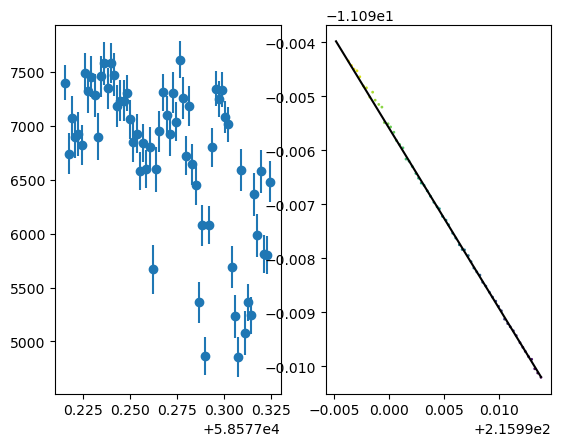

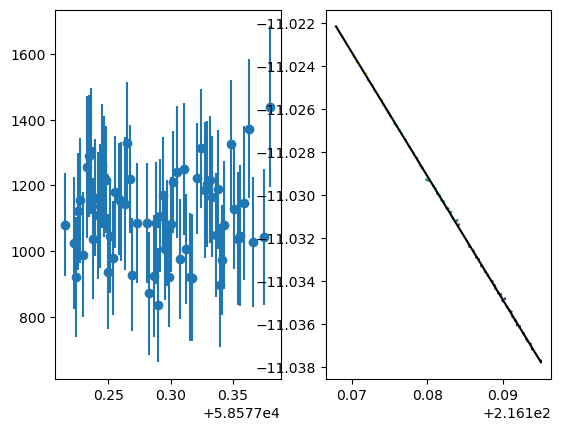

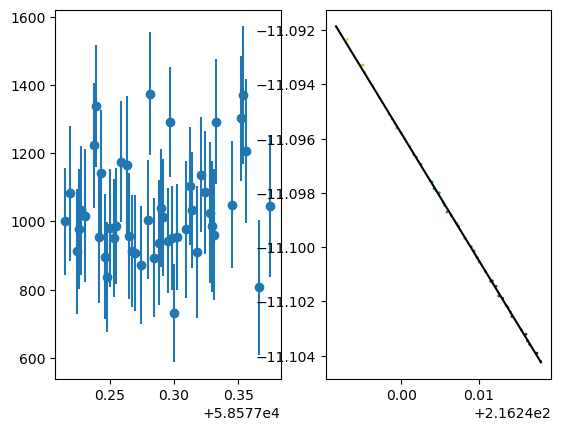

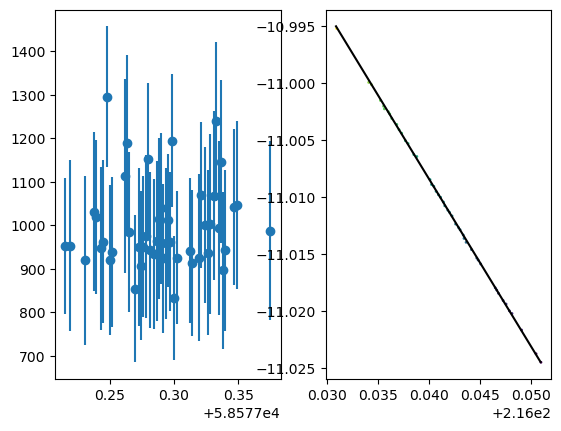

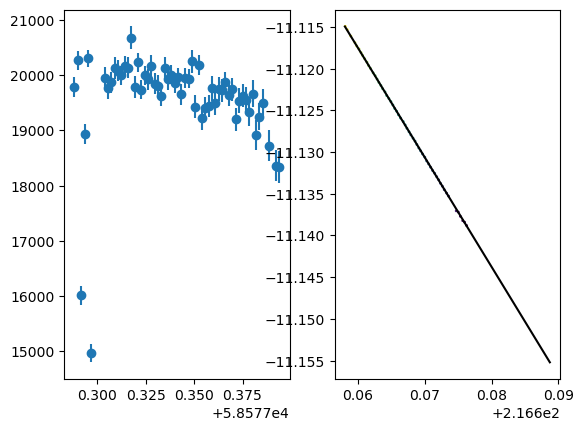

...

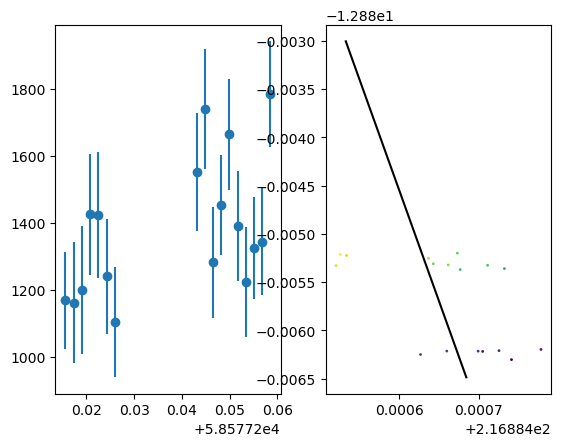

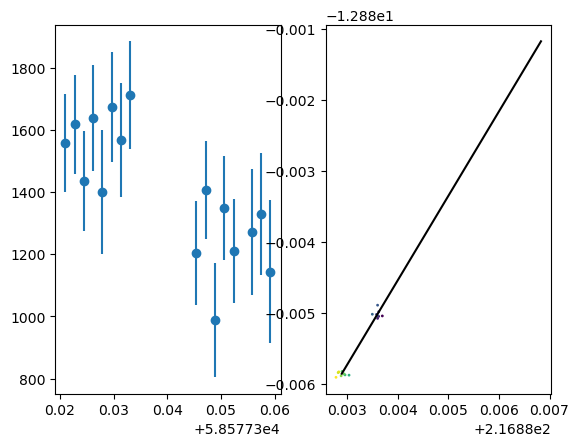

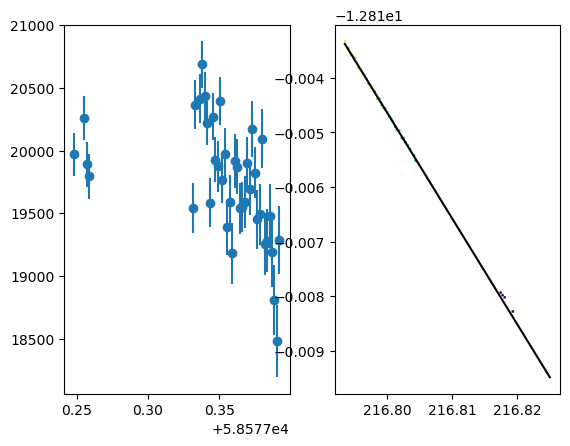

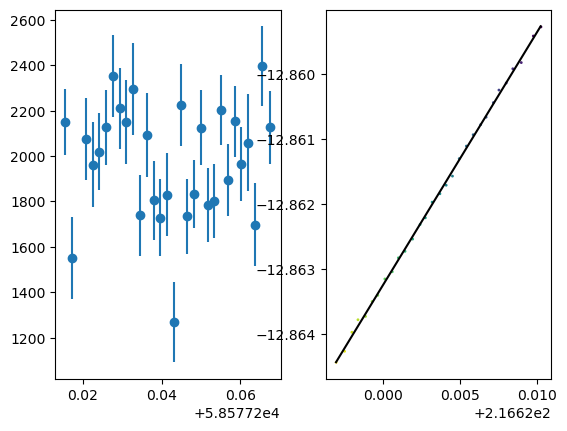

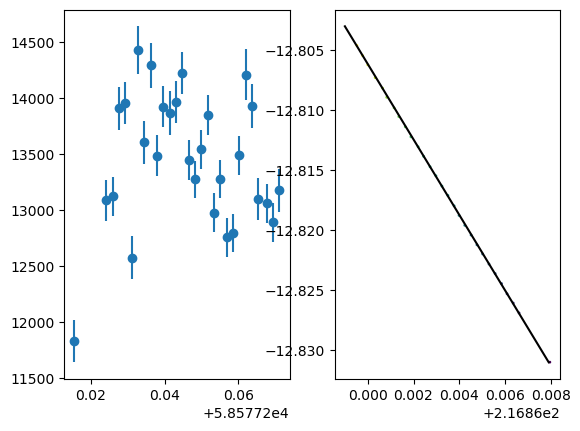

In [79]:
p = astropy.table.Table.read(
    Path("/epyc/data4/salad_simpler_search/merged/gathered_pointing_group_20190403_A0c_detector_*_snr_5.0_results_0.1_0.5_0_359_10_50.fits")
)
t = astropy.table.Table.read(
    Path("/epyc/data4/salad_simpler_search/merged/tracklet_pointing_group_20190403_A0c_detector_*_snr_5.0_results_0.1_0.5_0_359_10_50.fits")
)
for r in p.group_by(['detector', 'result_number']).groups:
    x = t[(t['detector'] == r[0]['detector']) & (t['result_number'] == r[0]['result_number'])][0]
    
    ra0 = x['vra'] * x['t0'] + x['ra_0']
    ra1 = x['vra'] * x['t1'] + x['ra_0']
    dec0 = x['vdec'] * x['t0'] + x['dec_0']
    dec1 = x['vdec'] * x['t1'] + x['dec_0']
#     print(ra0, ra1, dec0, dec1)
    n = len(r)
    if n < 15:
        continue

    fig, axs = plt.subplots(1, 2)
    plt.sca(axs[0])
    plt.errorbar(r['time'], r['flux'], yerr=r['flux_sigma'], fmt='o')
    plt.sca(axs[1])
    plt.scatter(r['ra'], r['dec'], c=r['time'], s=1)
    plt.plot([ra0, ra1], [dec0, dec1], color='k')
    plt.show()
#     break

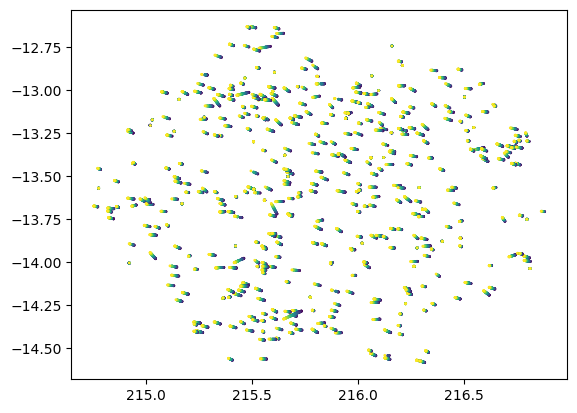

In [95]:
t = astropy.table.Table.read(
    Path("/epyc/data4/salad_simpler_search/merged/gathered_pointing_group_20190402_A0b_detector_*_snr_5.0_results_0.1_0.5_0_359_10_50.fits")
)

# t = t[t['result_number'] <= 15]
for r in t.group_by(["detector", "result_number"]).groups:
    if len(r) > 20:
        plt.scatter(r['ra'], r['dec'], c=r['time'], s=1)
plt.show()

In [96]:
astropy.table.Table.read(
    Path(
        "/epyc/data4/salad_simpler_search/merged/tracklet_pointing_group_20190403_A0c_detector_*_snr_5.0_results_0.1_0.5_0_359_10_50.fits"
    )
)

vra,vdec,ra_0,dec_0,t0,t1,sigma_vra,sigma_vdec,sigma_vravdec,sigma_vdecvra,sigma_t,detector,night,field,snr,results_type,result_number
deg / d,deg / d,deg,deg,d,d,deg / d,deg / d,deg2 / d2,deg2 / d2,d,,,,,,
float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64,bytes3,float64,bytes19,int64
-0.04134524085782435,-0.07440514861044337,2638.0261078184544,4346.42371822498,58577.21560552204,58577.345413955394,0.0004023930534839517,0.0005817988769767278,2.2089253932979399e-07,2.2089253932979399e-07,0.0003651843991777133,34,20190403,A0c,5.0,0.1_0.5_0_359_10_50,34
-0.10137065347003957,0.015450466034884381,6154.134060135301,-917.1572876396775,58577.21560552204,58577.38366577728,0.0006084079571456696,7.307015171443965e-05,-3.0976403664278976e-08,-3.097640366427887e-08,0.00036510730655198924,34,20190403,A0c,5.0,0.1_0.5_0_359_10_50,37
0.014420470844194453,-0.07077531173054012,-628.5289589304166,4133.749195387906,58577.21560552204,58577.322749470826,0.00021121835857202173,0.00045294269844487676,-6.772497328970519e-08,-6.772497328970524e-08,0.00023488323825433637,34,20190403,A0c,5.0,0.1_0.5_0_359_10_50,21
-0.07832243947980154,-0.04363320146001249,4804.099073929041,2543.8899331786174,58577.21560552204,58577.37852532789,0.0005950788213108558,0.0004007761527301647,2.2973144279896216e-07,2.2973144279896184e-07,0.00023418637068838425,34,20190403,A0c,5.0,0.1_0.5_0_359_10_50,24
-0.021900904565778586,0.04803255472286329,1499.0278851913845,-2825.648192143997,58577.21560552204,58577.393984940834,0.0004819516949040277,0.00038823964164924087,3.3937370203325164e-08,3.3937370203325164e-08,2.7636480968975355e-05,34,20190403,A0c,5.0,0.1_0.5_0_359_10_50,27
0.03008333709176859,-0.007735046597024982,-1546.1417521256192,441.047374834616,58577.21560552204,58577.35574921034,0.0003472223376745511,0.00020958923523746274,-5.330179986853171e-08,-5.3301799868531704e-08,5.550233138317428e-05,34,20190403,A0c,5.0,0.1_0.5_0_359_10_50,43
0.05495435066183509,0.10569131289922512,-3002.891550188926,-6203.184797552585,58577.21560552204,58577.39226360712,0.0003166568195278237,0.0006410419754089988,1.8193074272870142e-07,1.819307427287048e-07,0.004026820004508694,34,20190403,A0c,5.0,0.1_0.5_0_359_10_50,46
0.0477852872542333,-0.012647170344448367,-2583.076575625755,728.7870060396335,58577.21560552204,58577.39226360712,0.0005229716579249153,0.00011456282115949654,3.4244335321990168e-09,3.42443353219902e-09,4.052483616310433e-05,34,20190403,A0c,5.0,0.1_0.5_0_359_10_50,41


In [179]:
set(t['detector'])

{1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15}